This is a YOLO model training to detect Guppy fish objects. The model used is the yolov8s model with a total of 200 training epochs. This model is trained to detect Guppy fish objects for my thesis in the form of predicting oxygen levels in aquascape water through fish positions, but it is possible that the results of this model training can also be used for other things.

The code arrangement pattern that I use for this training, I take references from the code on the following Kaggle link:

https://www.kaggle.com/code/pkdarabi/traffic-signs-detection-using-yolov8

made by Parisa Karimi Darabi, then I modified it to suit this case.

**1.Check the files in the dataset folder**

This is a code cell to check the files in the dataset, but this code cell can be left unused if you want to train the YOLO model on local computing, while for non-Kaggle cloud computing you only need to change the contents of "os.walk".

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('../robot_data'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

../robot_data\test\images\robot_fish_109.png
../robot_data\test\images\robot_fish_113.png
../robot_data\test\images\robot_fish_122.png
../robot_data\test\images\robot_fish_123.png
../robot_data\test\images\robot_fish_127.png
../robot_data\test\images\robot_fish_128.png
../robot_data\test\images\robot_fish_134.png
../robot_data\test\images\robot_fish_147.png
../robot_data\test\images\robot_fish_148.png
../robot_data\test\images\robot_fish_149.png
../robot_data\test\images\robot_fish_153.png
../robot_data\test\images\robot_fish_156.png
../robot_data\test\images\robot_fish_157.png
../robot_data\test\images\robot_fish_164.png
../robot_data\test\images\robot_fish_175.png
../robot_data\test\images\robot_fish_178.png
../robot_data\test\images\robot_fish_180.png
../robot_data\test\images\robot_fish_195.png
../robot_data\test\images\robot_fish_205.png
../robot_data\test\images\robot_fish_207.png
../robot_data\test\images\robot_fish_221.png
../robot_data\test\images\robot_fish_225.png
../robot_d

**2.Import Library**

code cell to import the required libraries

In [2]:
# !pip install ultralytics
# Import Essential Libraries
import os
import random
import pandas as pd
from PIL import Image
import cv2
from ultralytics import YOLO
from IPython.display import Video
import numpy as np  
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style='darkgrid')
import pathlib
import glob
from tqdm.notebook import trange, tqdm
import warnings
warnings.filterwarnings('ignore')

**3. Configure the plot display that the Seaborn library will create**

In [3]:
# Configure the visual appearance of Seaborn plots
sns.set_theme(rc={'axes.facecolor': '#eae8fa'}, style='darkgrid')

**4. Displays 9 random images in the train folder**

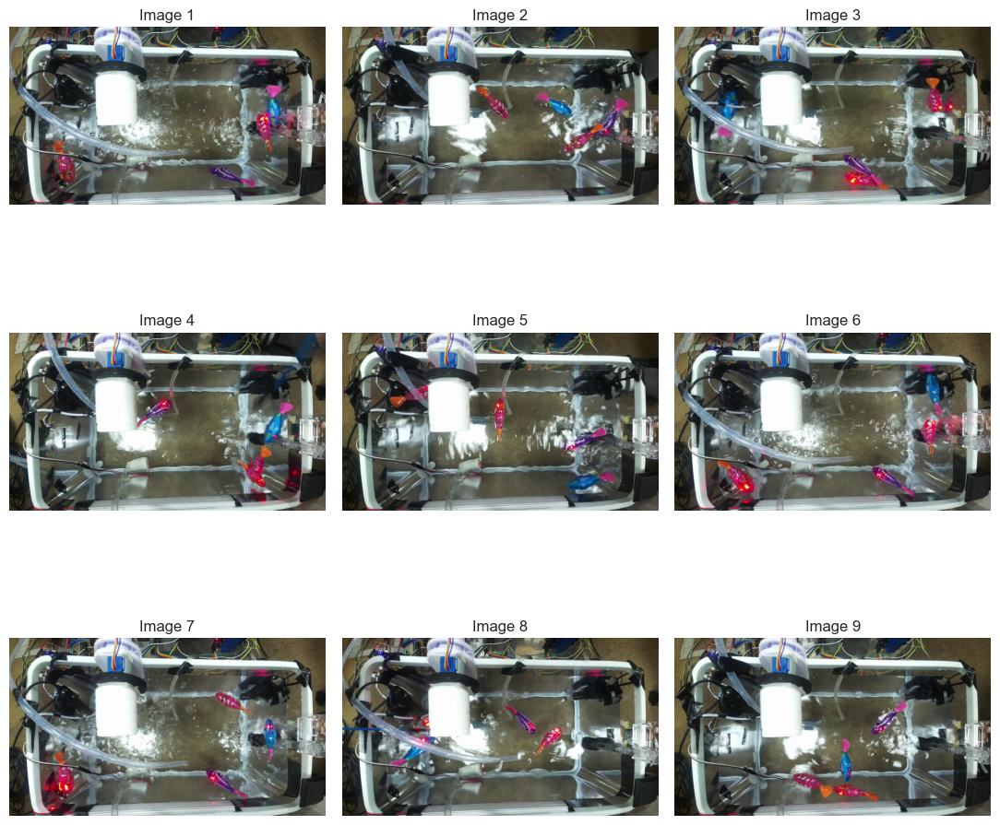

In [5]:
Image_dir = '../robot_data/train/images'

num_samples = 9
image_files = os.listdir(Image_dir)

# Randomly select num_samples images
rand_images = random.sample(image_files, num_samples)

fig, axes = plt.subplots(3, 3, figsize=(11, 11))

for i in range(num_samples):
    image = rand_images[i]
    ax = axes[i // 3, i % 3]
    ax.imshow(plt.imread(os.path.join(Image_dir, image)))
    ax.set_title(f'Image {i+1}')
    ax.axis('off')

plt.tight_layout()
plt.show()

**5. Get resolution and channel information on one of the images in the train folder**

In [6]:
# Get the size of the image
image = cv2.imread("../robot_data/train/images/robot_fish_76.png")
h, w, c = image.shape
print(f"The image has dimensions {w}x{h} and {c} channels.")

The image has dimensions 2304x1296 and 3 channels.


**6. Object detection from selected images using yolov8s default**

Object detection using YOLO version of COCO dataset


image 1/1 c:\Source\YOLO_Practice\YOLO_V8\Learning\..\robot_data\train\images\robot_fish_76.png: 384x640 1 parking meter, 59.4ms
Speed: 6.7ms preprocess, 59.4ms inference, 130.6ms postprocess per image at shape (1, 3, 384, 640)


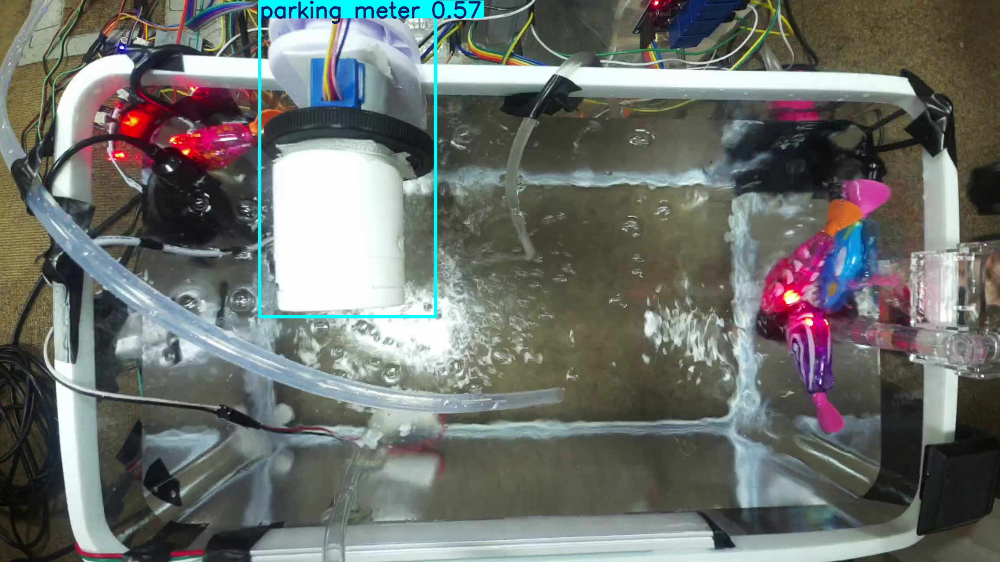

In [7]:
# Use a pretrained YOLOv8n model
model = YOLO("yolov8s.pt") 

# Use the model to detect object
image = "../robot_data/train/images/robot_fish_76.png"
result_predict = model.predict(source = image, imgsz=(640))

# show results
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))

**7. Cell code for YOLO training using guppy-fish-dataset-yolo dataset**

The configuration of training and data augmentation used can be changed according to your wishes.

In [8]:
# Build from YAML and transfer weights
Final_model = YOLO('yolov8s.pt')

# Training The Final Model
Result_Final_model = Final_model.train(
    data="../Sample_data.yaml", 
    epochs = 50, 
    imgsz = 640,
    lr0 = 0.005,
    momentum = 0.9,
    weight_decay = 0.005,
    warmup_epochs = 5,
    warmup_momentum = 0.8,
    warmup_bias_lr = 0.01,
    batch = 32,
    device = 0,

    mosaic = 1.0,
    mixup = 0.0,
    fliplr = 0.5,
    flipud = 0.3,
    degrees = 15.0,
    translate = 0.1,
    scale = 0.3,
    shear = 2.0,
    hsv_h = 0.015,
    hsv_s = 0.7,
    hsv_v = 0.4,

    cache = True,
    verbose = False,
    rect = False,
    cos_lr = True,
    profile = True,
    half=True
    )


New https://pypi.org/project/ultralytics/8.3.196 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.161  Python-3.10.11 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 3060, 12288MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=../Sample_data.yaml, degrees=15.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.3, format=torchscript, fraction=1.0, freeze=None, half=True, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.005, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.9, mosaic=1.0, multi_scale=False, name=train5, nbs=64, nms=False, opset=None, optimize=False

train: Scanning C:\Source\YOLO_Practice\YOLO_V8\robot_data\train\labels... 350 images, 0 backgrounds, 0 corrupt: 100%|██████████| 350/350 [00:02<00:00, 123.96it/s]


train: New cache created: C:\Source\YOLO_Practice\YOLO_V8\robot_data\train\labels.cache
WARNING cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (0.2GB RAM): 100%|██████████| 350/350 [00:02<00:00, 146.99it/s]


val: Fast image access  (ping: 0.20.1 ms, read: 191.342.5 MB/s, size: 3198.8 KB)


val: Scanning C:\Source\YOLO_Practice\YOLO_V8\robot_data\valid\labels... 75 images, 0 backgrounds, 0 corrupt: 100%|██████████| 75/75 [00:00<00:00, 87.11it/s]

val: New cache created: C:\Source\YOLO_Practice\YOLO_V8\robot_data\valid\labels.cache


WARNING cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.0GB RAM): 100%|██████████| 75/75 [00:00<00:00, 122.67it/s]


Plotting labels to c:\Source\YOLO_Practice\runs\detect\train5\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.005' and 'momentum=0.9' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to c:\Source\YOLO_Practice\runs\detect\train5
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      6.97G      2.057      3.273      1.731        199        640: 100%|██████████| 11/11 [00:06<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.33it/s]

                   all         75        296      0.817       0.83      0.893       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      6.85G      1.559      1.151      1.278        224        640: 100%|██████████| 11/11 [00:04<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.81it/s]

                   all         75        296      0.914      0.787      0.876      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      6.89G       1.42     0.8321      1.181        229        640: 100%|██████████| 11/11 [00:04<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.30it/s]

                   all         75        296      0.946      0.872      0.954      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      6.89G      1.402     0.7786       1.17        193        640: 100%|██████████| 11/11 [00:04<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.21it/s]

                   all         75        296      0.901       0.86      0.931      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      6.75G      1.375     0.7497      1.154        187        640: 100%|██████████| 11/11 [00:04<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.50it/s]

                   all         75        296      0.751      0.473      0.529      0.251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      6.84G      1.334     0.7408      1.152        192        640: 100%|██████████| 11/11 [00:04<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.01it/s]

                   all         75        296      0.118      0.203     0.0687     0.0191



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      6.85G      1.339     0.7148      1.144        240        640: 100%|██████████| 11/11 [00:04<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.21it/s]

                   all         75        296    0.00335       0.25    0.00211   0.000764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      6.84G      1.352     0.7281      1.153        206        640: 100%|██████████| 11/11 [00:04<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.58it/s]

                   all         75        296   8.89e-05    0.00676   4.59e-05   4.59e-06



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      6.88G       1.32     0.7356      1.145        187        640: 100%|██████████| 11/11 [00:04<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.30it/s]

                   all         75        296    0.00936      0.331    0.00709    0.00269



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      6.97G      1.272     0.6902      1.124        220        640: 100%|██████████| 11/11 [00:04<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.65it/s]

                   all         75        296    0.00202      0.108    0.00108   0.000298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      6.75G      1.238     0.6922      1.115        201        640: 100%|██████████| 11/11 [00:04<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.39it/s]

                   all         75        296      0.565      0.395      0.403       0.18



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      6.96G      1.263     0.6954      1.124        238        640: 100%|██████████| 11/11 [00:04<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.81it/s]

                   all         75        296     0.0871      0.311     0.0578     0.0166



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      6.75G      1.196     0.6509      1.089        198        640: 100%|██████████| 11/11 [00:04<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.10it/s]

                   all         75        296      0.663      0.551      0.597      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      6.97G       1.18     0.6349       1.09        215        640: 100%|██████████| 11/11 [00:04<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.45it/s]

                   all         75        296      0.189      0.173      0.113     0.0427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      6.89G      1.185     0.6255      1.092        212        640: 100%|██████████| 11/11 [00:04<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.09it/s]

                   all         75        296      0.554      0.257      0.265      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      6.97G      1.152     0.6096      1.083        197        640: 100%|██████████| 11/11 [00:04<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.18it/s]

                   all         75        296      0.677      0.443      0.519      0.242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      6.89G      1.165     0.6061      1.083        210        640: 100%|██████████| 11/11 [00:04<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.34it/s]

                   all         75        296      0.735      0.478      0.562      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      6.84G      1.154     0.6027      1.076        213        640: 100%|██████████| 11/11 [00:04<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.74it/s]

                   all         75        296      0.744      0.723      0.779       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      6.89G      1.134     0.5942      1.067        174        640: 100%|██████████| 11/11 [00:04<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.47it/s]

                   all         75        296      0.911      0.965      0.975      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      6.99G       1.14      0.584      1.068        203        640: 100%|██████████| 11/11 [00:04<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.05it/s]

                   all         75        296       0.93      0.976      0.984      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      6.75G       1.12     0.5842      1.071        201        640: 100%|██████████| 11/11 [00:04<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.39it/s]

                   all         75        296      0.982       0.98      0.988      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      6.98G      1.078      0.549      1.045        193        640: 100%|██████████| 11/11 [00:04<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.77it/s]

                   all         75        296      0.975      0.983      0.992      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      6.89G      1.062     0.5494      1.029        207        640: 100%|██████████| 11/11 [00:04<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.09it/s]

                   all         75        296       0.98       0.98      0.993      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      6.97G       1.08     0.5438      1.047        199        640: 100%|██████████| 11/11 [00:04<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.22it/s]

                   all         75        296      0.969      0.956      0.982      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      6.75G      1.055     0.5423      1.039        180        640: 100%|██████████| 11/11 [00:04<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.37it/s]

                   all         75        296      0.963      0.973      0.989      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      6.84G      1.072     0.5493      1.045        240        640: 100%|██████████| 11/11 [00:04<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.93it/s]

                   all         75        296      0.989      0.976      0.991      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      6.88G      1.067     0.5369      1.046        210        640: 100%|██████████| 11/11 [00:04<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.49it/s]

                   all         75        296       0.99      0.986      0.994      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      6.98G      1.035     0.5255      1.039        224        640: 100%|██████████| 11/11 [00:04<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.36it/s]

                   all         75        296      0.993      0.986      0.994      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      6.88G      1.015     0.5074      1.018        186        640: 100%|██████████| 11/11 [00:04<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.40it/s]

                   all         75        296      0.992      0.983      0.993      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      6.97G     0.9843     0.5016      1.019        206        640: 100%|██████████| 11/11 [00:04<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.39it/s]

                   all         75        296      0.992       0.99      0.995      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      6.89G     0.9788     0.4921      1.007        211        640: 100%|██████████| 11/11 [00:04<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.44it/s]

                   all         75        296      0.982      0.986      0.993      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      6.97G     0.9487     0.4799     0.9953        198        640: 100%|██████████| 11/11 [00:04<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.89it/s]

                   all         75        296      0.989      0.983      0.993      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      6.88G     0.9977     0.4865      1.018        223        640: 100%|██████████| 11/11 [00:04<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.20it/s]

                   all         75        296      0.993      0.986      0.993      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      6.97G     0.9386     0.4705     0.9923        231        640: 100%|██████████| 11/11 [00:04<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.24it/s]

                   all         75        296      0.992       0.99      0.993      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      6.88G     0.9383     0.4672     0.9896        230        640: 100%|██████████| 11/11 [00:04<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.98it/s]

                   all         75        296      0.993      0.988      0.992        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      6.93G     0.9216     0.4587     0.9869        202        640: 100%|██████████| 11/11 [00:04<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.02it/s]

                   all         75        296      0.993      0.989      0.991      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      6.89G     0.9254     0.4574     0.9852        186        640: 100%|██████████| 11/11 [00:04<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.45it/s]

                   all         75        296       0.99       0.99      0.992      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      6.83G     0.9128     0.4541     0.9807        216        640: 100%|██████████| 11/11 [00:04<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.07it/s]

                   all         75        296      0.997      0.989      0.995      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      6.88G     0.9311     0.4418     0.9819        212        640: 100%|██████████| 11/11 [00:04<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.46it/s]

                   all         75        296      0.987      0.988      0.994      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      6.97G     0.9291     0.4485     0.9843        248        640: 100%|██████████| 11/11 [00:04<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.41it/s]

                   all         75        296      0.995       0.99      0.995      0.725


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50       6.8G     0.8492     0.3954     0.9371        119        640: 100%|██████████| 11/11 [00:04<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.41it/s]

                   all         75        296      0.999       0.99      0.995      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      6.89G     0.8465     0.3762     0.9333        117        640: 100%|██████████| 11/11 [00:04<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.82it/s]

                   all         75        296      0.999       0.99      0.995      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50       6.8G      0.817     0.3637     0.9352        116        640: 100%|██████████| 11/11 [00:04<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.11it/s]

                   all         75        296      0.999       0.99      0.995      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      6.89G      0.825     0.3625     0.9326        118        640: 100%|██████████| 11/11 [00:04<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.70it/s]

                   all         75        296          1      0.993      0.995      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50       6.8G     0.7945     0.3575     0.9216        118        640: 100%|██████████| 11/11 [00:04<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.61it/s]

                   all         75        296      0.999      0.993      0.995      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      6.89G     0.8273     0.3614      0.935        120        640: 100%|██████████| 11/11 [00:04<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.08it/s]

                   all         75        296      0.999      0.993      0.995      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50       6.8G     0.8252     0.3581     0.9337        119        640: 100%|██████████| 11/11 [00:04<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.94it/s]

                   all         75        296      0.992      0.993      0.995      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      6.89G     0.7978     0.3546     0.9176        120        640: 100%|██████████| 11/11 [00:04<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.45it/s]

                   all         75        296      0.993      0.993      0.995      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50       6.8G     0.7974     0.3533       0.92        120        640: 100%|██████████| 11/11 [00:04<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.26it/s]

                   all         75        296      0.993      0.993      0.995      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      6.89G     0.7983     0.3533     0.9199        118        640: 100%|██████████| 11/11 [00:04<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.16it/s]

                   all         75        296      0.993      0.993      0.995      0.728



50 epochs completed in 0.080 hours.
Optimizer stripped from c:\Source\YOLO_Practice\runs\detect\train5\weights\last.pt, 22.5MB
Optimizer stripped from c:\Source\YOLO_Practice\runs\detect\train5\weights\best.pt, 22.5MB

Validating c:\Source\YOLO_Practice\runs\detect\train5\weights\best.pt...
Ultralytics 8.3.161  Python-3.10.11 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 3060, 12288MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.29it/s]


                   all         75        296      0.993      0.993      0.995      0.733
Speed: 0.3ms preprocess, 2.1ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to c:\Source\YOLO_Practice\runs\detect\train5


**8. Displays training results.**

The training results in question are in the form of confusion matrix, F1-score graph, Precision, Recall, and others that are needed for analysis.

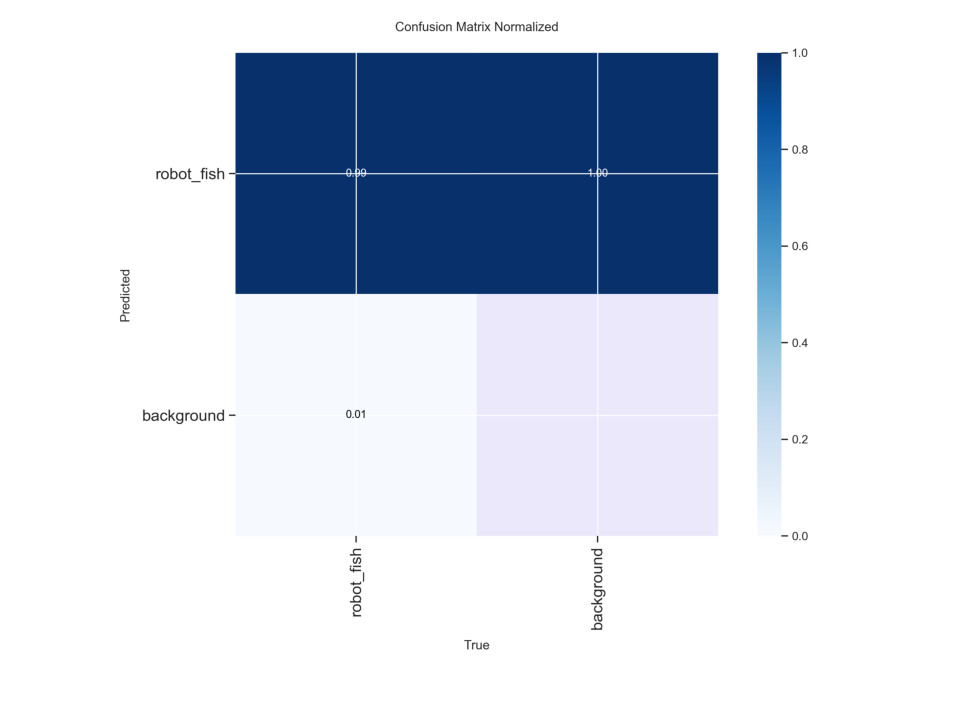

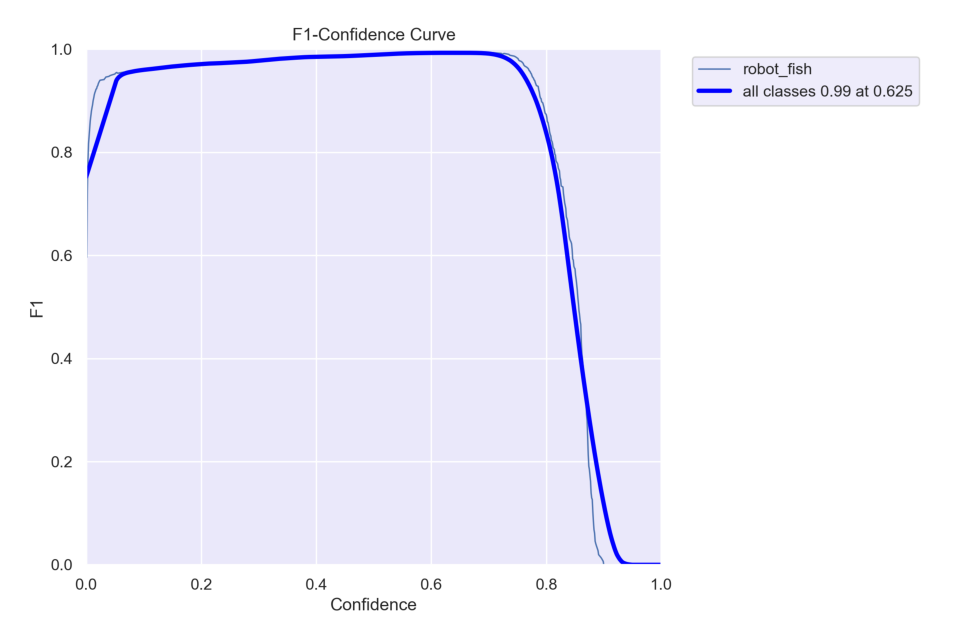

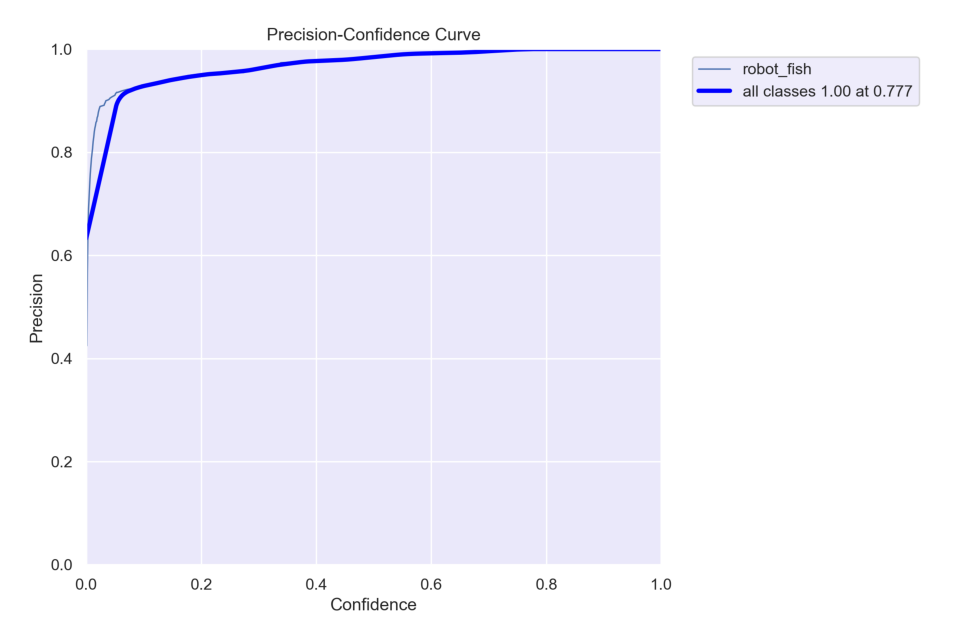

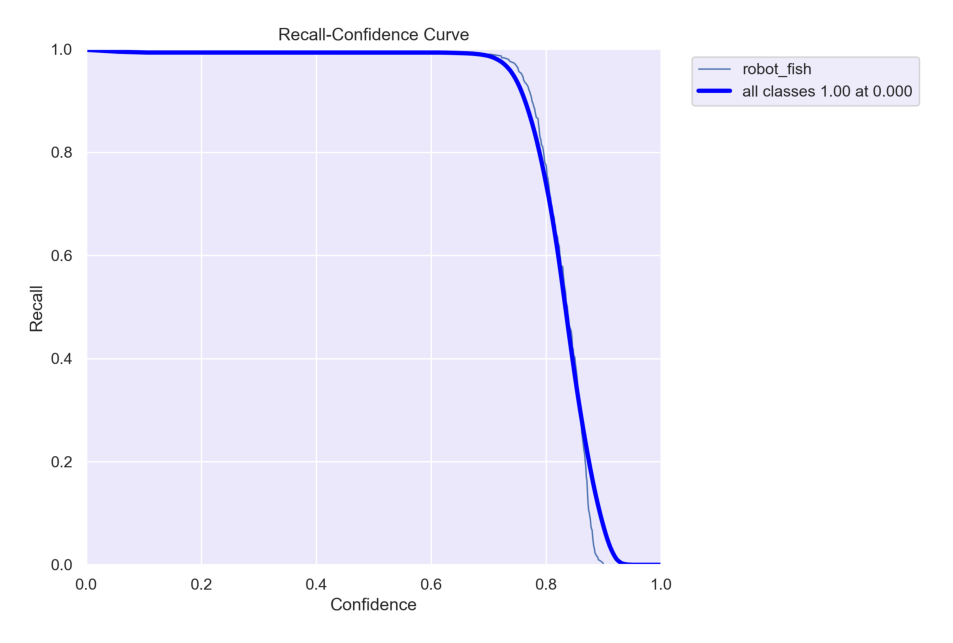

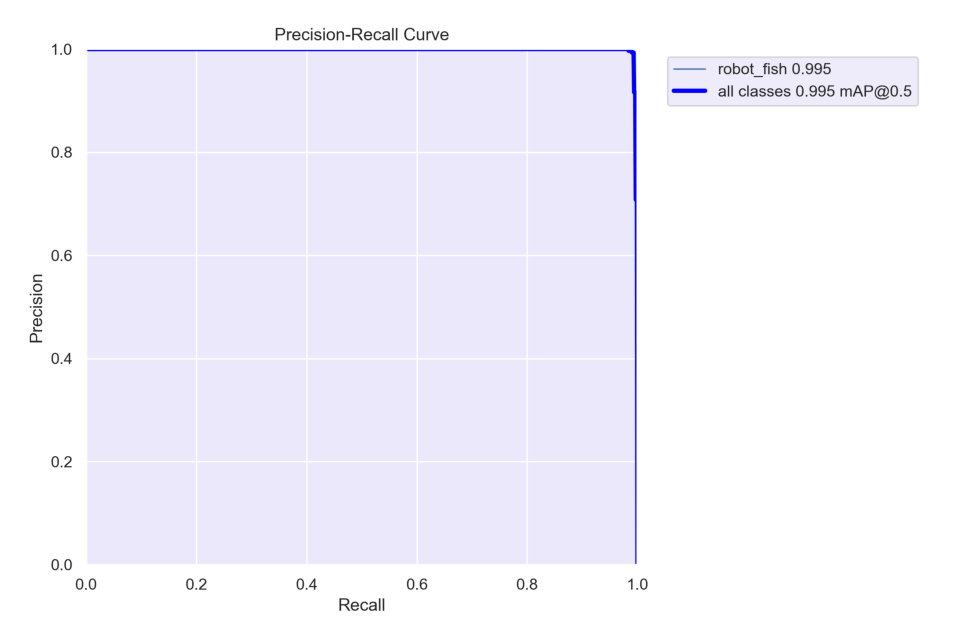

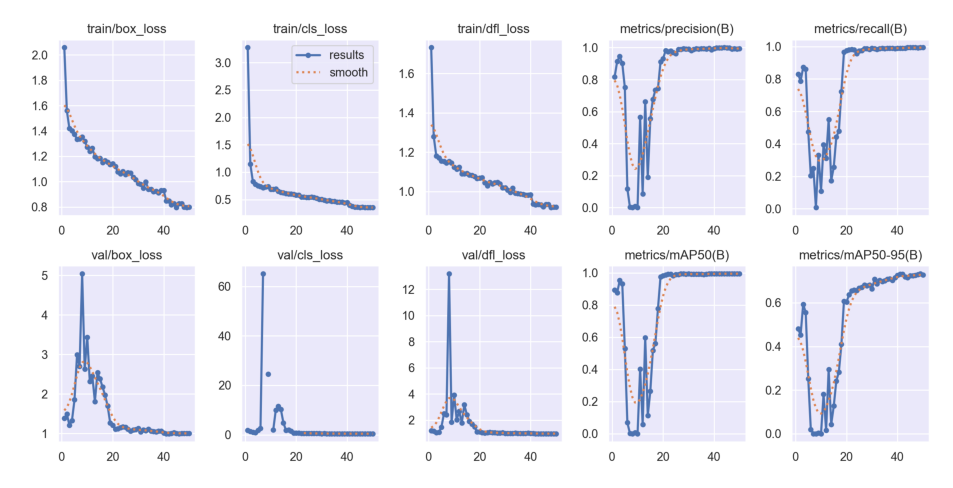

In [9]:
import os
import cv2
import matplotlib.pyplot as plt

def display_images(post_training_files_path, image_files):

    for image_file in image_files:
        image_path = os.path.join(post_training_files_path, image_file)
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        plt.figure(figsize=(10, 10), dpi=120)
        plt.imshow(img)
        plt.axis('off')
        plt.show()

# List of image files to display
image_files = [
    'confusion_matrix_normalized.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'PR_curve.png',
    'results.png'
]

# Path to the directory containing the images
post_training_files_path = 'C:/Source/YOLO_Practice/runs/detect/train5'

# Display the images
display_images(post_training_files_path, image_files)


**9. Display training results in csv format**

In [10]:
Result_Final_model = pd.read_csv('C:/Source/YOLO_Practice/runs/detect/train5/results.csv')
Result_Final_model.tail(10)

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
40,41,242.221,0.84925,0.39543,0.93714,0.99916,0.98986,0.99493,0.73131,0.99510,0.42618,0.97689,0.000209,0.000209,0.000209
41,42,247.506,0.84647,0.37620,0.93326,0.99907,0.98986,0.99483,0.73136,0.99493,0.42081,0.96705,0.000174,0.000174,0.000174
42,43,252.722,0.81704,0.36370,0.93519,0.99939,0.98986,0.99497,0.71847,1.00462,0.41434,0.95978,0.000142,0.000142,0.000142
43,44,258.058,0.82498,0.36248,0.93263,0.99991,0.99324,0.99500,0.71531,1.02409,0.41456,0.96596,0.000114,0.000114,0.000114
44,45,263.201,0.79446,0.35752,0.92157,0.99950,0.99324,0.99500,0.72476,1.00106,0.40562,0.96815,0.000090,0.000090,0.000090
45,46,268.392,0.82735,0.36142,0.93505,0.99940,0.99324,0.99500,0.72378,0.99753,0.40354,0.96809,0.000068,0.000068,0.000068
46,47,273.623,0.82525,0.35814,0.93371,0.99212,0.99324,0.99493,0.72544,1.00294,0.40924,0.96907,0.000051,0.000051,0.000051
47,48,278.761,0.79780,0.35460,0.91760,0.99324,0.99310,0.99493,0.72888,1.00836,0.41300,0.97007,0.000038,0.000038,0.000038
48,49,283.969,0.79739,0.35327,0.91995,0.99254,0.99324,0.99493,0.73302,1.00630,0.41338,0.97177,0.000028,0.000028,0.000028
49,50,289.196,0.79828,0.35327,0.91989,0.99262,0.99324,0.99493,0.72839,1.00034,0.40946,0.97072,0.000022,0.000022,0.000022


**10. Creating a graph from data in a csv file**

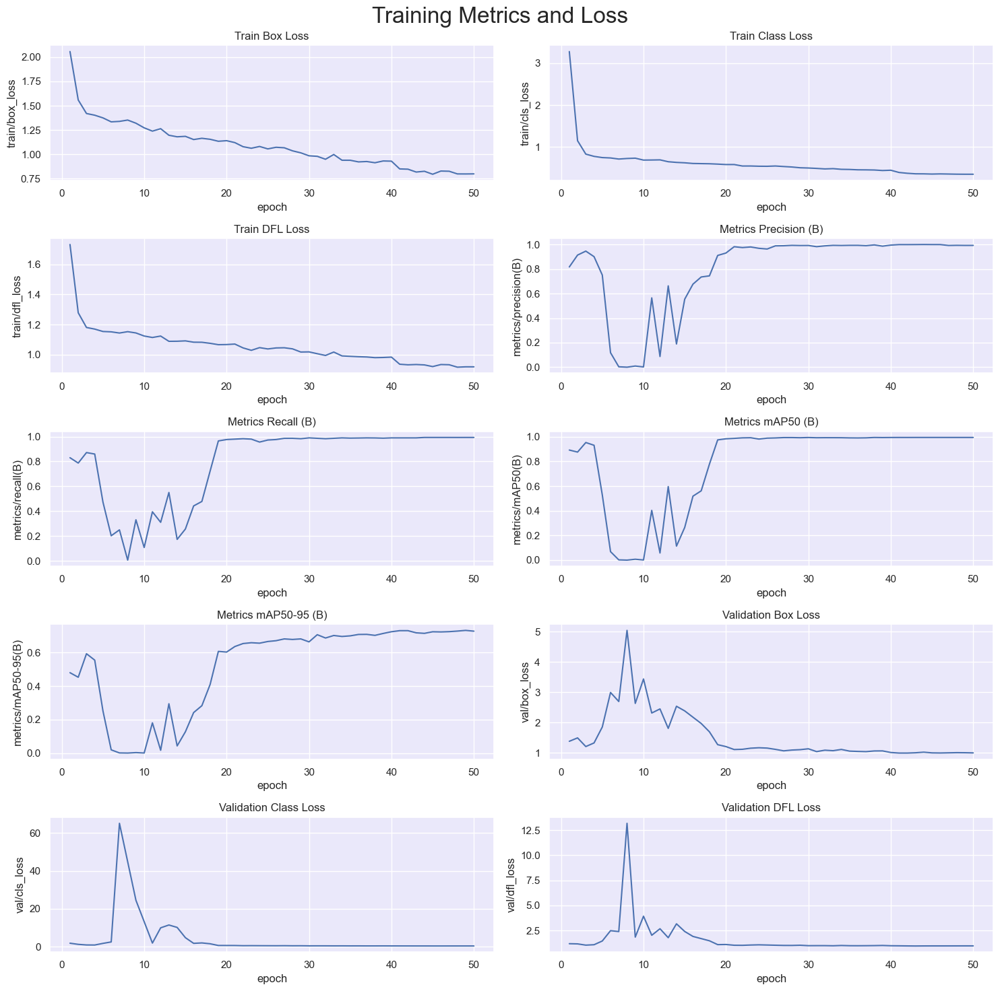

In [11]:
# Read the results.csv file as a pandas dataframe
Result_Final_model.columns = Result_Final_model.columns.str.strip()

# Create subplots
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# Plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=Result_Final_model, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=Result_Final_model, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=Result_Final_model, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=Result_Final_model, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=Result_Final_model, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=Result_Final_model, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=Result_Final_model, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=Result_Final_model, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=Result_Final_model, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=Result_Final_model, ax=axs[4,1])

# Set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')


plt.suptitle('Training Metrics and Loss', fontsize=24)
plt.subplots_adjust(top=0.8)
plt.tight_layout()
plt.show()

**11. Performing model performance validation**

In [12]:
# Loading the best performing model
Valid_model = YOLO('C:/Source/YOLO_Practice/runs/detect/train5/weights/best.pt')

# Evaluating the model on the validset
metrics = Valid_model.val(split = 'val')

# final results 
print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

Ultralytics 8.3.161  Python-3.10.11 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 3060, 12288MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access  (ping: 0.30.1 ms, read: 1060.6132.5 MB/s, size: 3182.0 KB)


val: Scanning C:\Source\YOLO_Practice\YOLO_V8\robot_data\valid\labels.cache... 75 images, 0 backgrounds, 0 corrupt: 100%|██████████| 75/75 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.02s/it]


                   all         75        296      0.993      0.993      0.995      0.731
Speed: 1.0ms preprocess, 6.2ms inference, 0.0ms loss, 4.4ms postprocess per image
Results saved to c:\Source\YOLO_Practice\runs\detect\val5
precision(B):  0.9925230138706009
metrics/recall(B):  0.9932432432432432
metrics/mAP50(B):  0.9949324324324323
metrics/mAP50-95(B):  0.7311075921694912


**12. Detecting guppy fish in 9 random images on the dataset using the trained YOLO model.**


0: 640x640 3 robot_fishs, 73.2ms
Speed: 4.7ms preprocess, 73.2ms inference, 4.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 4 robot_fishs, 7.2ms
Speed: 1.5ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 4 robot_fishs, 14.4ms
Speed: 1.7ms preprocess, 14.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 5 robot_fishs, 7.4ms
Speed: 1.5ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 3 robot_fishs, 14.6ms
Speed: 1.9ms preprocess, 14.6ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 4 robot_fishs, 7.4ms
Speed: 1.5ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 4 robot_fishs, 7.2ms
Speed: 1.5ms preprocess, 7.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 6 robot_fishs, 7.1ms
Speed: 1.5ms preprocess, 7.1ms inference, 1.5ms postproces

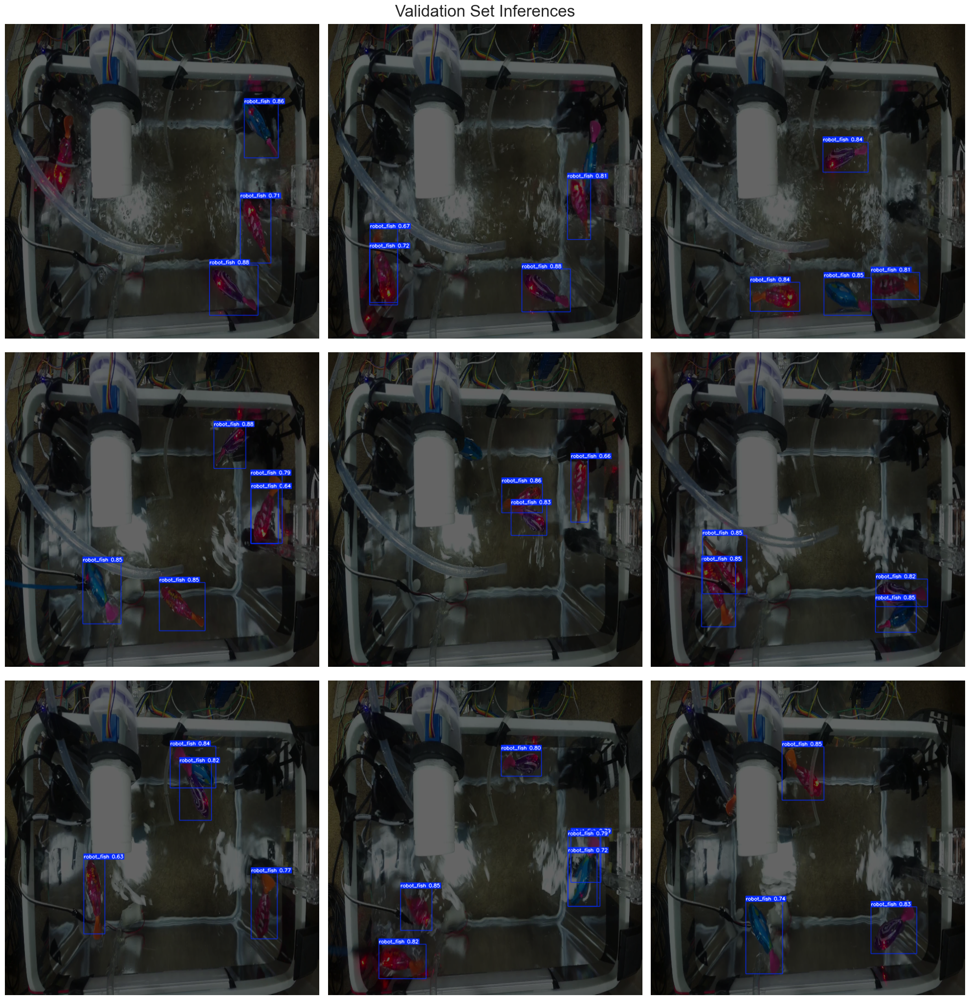

In [13]:
# Normalization function
def normalize_image(image):
    return image / 640.0

# Image resizing function
def resize_image(image, size=(640, 640)):
    return cv2.resize(image, size)

# Path to validation images
dataset_path = '../robot_data/'  # Place your dataset path here
valid_images_path = os.path.join(dataset_path, 'test', 'images')

# List of all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.png')]

# Check if there are images in the directory
if len(image_files) > 0:
    # Select 9 images at equal intervals
    num_images = len(image_files)
    step_size = max(1, num_images // 9)  # Ensure the interval is at least 1
    selected_images = [image_files[i] for i in range(0, num_images, step_size)]

    # Prepare subplots
    fig, axes = plt.subplots(3, 3, figsize=(20, 21))
    fig.suptitle('Validation Set Inferences', fontsize=24)

    for i, ax in enumerate(axes.flatten()):
        if i < len(selected_images):
            image_path = os.path.join(valid_images_path, selected_images[i])
            
            # Load image
            image = cv2.imread(image_path)
            
            # Check if the image is loaded correctly
            if image is not None:
                # Resize image
                resized_image = resize_image(image, size=(640, 640))
                # Normalize image
                normalized_image = normalize_image(resized_image)
                
                # Convert the normalized image to uint8 data type
                normalized_image_uint8 = (normalized_image * 255).astype(np.uint8)
                
                # Predict with the model
                results = Valid_model.predict(source=normalized_image_uint8, imgsz=640, conf=0.5)
                
                # Plot image with labels
                annotated_image = results[0].plot(line_width=1)
                annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
                ax.imshow(annotated_image_rgb)
            else:
                print(f"Failed to load image {image_path}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()


In [14]:
# 영상 및 모델 경로
video_path = 'C:/Source/YOLO_Practice/YOLO_V8/robot_data/fish_direct.mp4'
model = YOLO('C:/Source/YOLO_Practice/runs/detect/train5/weights/best.pt')

# 비디오 캡처 열기
cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)

# 🔧 첫 프레임을 읽어 회전하고, 정확한 크기 측정
ret, frame = cap.read()
if not ret:
    raise RuntimeError("영상을 읽을 수 없습니다.")

# 프레임 회전 (반시계 90도)
# frame = cv2.rotate(frame, cv2.ROTATE_90_COUNTERCLOCKWISE)
height, width = frame.shape[:2]

# VideoWriter 초기화 (회전된 프레임 크기 사용)
out = cv2.VideoWriter('output_detected_2.mp4',
                      cv2.VideoWriter_fourcc(*'mp4v'),
                      fps, (width, height))

# 🔁 첫 프레임 처리
results = model.predict(source=frame, conf=0.5, verbose=False)
annotated_frame = results[0].plot()
out.write(annotated_frame)
cv2.imshow("Detected", annotated_frame)
cv2.waitKey(1)

# 🔁 나머지 프레임 반복 처리
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    frame = cv2.rotate(frame, cv2.ROTATE_90_COUNTERCLOCKWISE)
    results = model.predict(source=frame, conf=0.5, verbose=False)
    annotated_frame = results[0].plot()
    out.write(annotated_frame)

    cv2.imshow("Detected", annotated_frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
out.release()
cv2.destroyAllWindows()
